## **Retail Customer Segmentation & Analysis using RFM – Project Summary**

### - This project focuses on segmenting customers based on purchasing behavior using RFM (Recency, Frequency, Monetary) analysis, enabling data-driven marketing, retention, and revenue optimization decisions.

## **Steps**:

### 1- Data Understanding & Preparation

### 2- Univariate Analysis :

### 3- RFM Table Creation & Univariate EDA

### 4- Analysis of RFM Features and Original Data

### 5- Modeling & Clustering

### 6- Cluster Profiling & Interpretation

### 7- deployment via strealit

# Retail Customer Segmentation & Analysis_by_RFM

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [2]:
import plotly.io as pio
pio.renderers.default = 'svg'

# import data

In [3]:
import pandas as pd

df = pd.read_csv(
    '/Users/mohammedmahmood/Desktop/Data projects/Projects/Data science/Unsupervised proj/Retail Customer Segmentation Using RFM Analysis and/data/Online_Retail.csv',
    encoding="ISO-8859-1"
)

In [4]:
# shape of data
df.shape

(541909, 8)

In [5]:
# sample of data
df.sample(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
128911,547367,84874B,BLUE TRAVEL FIRST AID KIT,1,3/22/11 13:11,1.65,15437.0,United Kingdom
260451,559812,21875,KINGS CHOICE MUG,6,7/12/11 15:29,1.25,15051.0,United Kingdom
86060,543533,22698,PINK REGENCY TEACUP AND SAUCER,2,2/9/11 13:00,5.79,NaN,United Kingdom
131512,547568,21035,SET/2 RED RETROSPOT TEA TOWELS,6,3/24/11 9:50,3.25,13341.0,United Kingdom
345486,567167,21918,SET 12 KIDS COLOUR CHALK STICKS,4,9/18/11 12:21,0.42,15547.0,United Kingdom
363177,568551,22379,RECYCLING BAG RETROSPOT,5,9/27/11 14:58,2.10,14883.0,United Kingdom
397652,571193,23292,SPACEBOY CHILDRENS CUP,8,10/14/11 11:56,1.25,15484.0,United Kingdom
367328,568881,22469,HEART OF WICKER SMALL,12,9/29/11 12:39,1.65,13960.0,United Kingdom
203236,554512,85099C,JUMBO BAG BAROQUE BLACK WHITE,1,5/24/11 15:54,4.13,NaN,United Kingdom
14562,537604,22555,PLASTERS IN TIN STRONGMAN,12,12/7/10 13:01,1.65,13488.0,United Kingdom


# check duplicated

In [6]:
df.duplicated().sum()

np.int64(5268)

In [7]:
df.drop_duplicates(inplace= True)
df.reset_index(inplace= True, drop= True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536641 entries, 0 to 536640
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    536641 non-null  object 
 1   StockCode    536641 non-null  object 
 2   Description  535187 non-null  object 
 3   Quantity     536641 non-null  int64  
 4   InvoiceDate  536641 non-null  object 
 5   UnitPrice    536641 non-null  float64
 6   CustomerID   401604 non-null  float64
 7   Country      536641 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 32.8+ MB


## Handling Null Values

- **CustomerID** has 135,037 missing values.  
  Since we will use CustomerID for **RFM clustering** (which relies on customer purchase history), we will **drop rows** with missing CustomerID values.

In [9]:
df.isna().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135037
Country             0
dtype: int64

In [10]:
#  DROP NULL IN CustomerID
df.dropna(subset= ["CustomerID"], inplace= True)

In [11]:
df.drop_duplicates(inplace= True)
df.reset_index(inplace= True, drop= True)

In [12]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,401604.000000,401604.000000,401604.000000
mean,12.183273,3.474064,15281.160818
std,250.283037,69.764035,1714.006089
min,-80995.000000,0.000000,12346.000000
25%,2.000000,1.250000,13939.000000
50%,5.000000,1.950000,15145.000000
75%,12.000000,3.750000,16784.000000
max,80995.000000,38970.000000,18287.000000


- **Negative Quantity values** exist in the dataset, which likely represent product returns or cancellations.  
  Since these return transactions would distort the RFM analysis, **all rows with negative Quantity** will be removed.

In [13]:
# remove negative quantity
df = df[~df["InvoiceNo"].astype(str).str.startswith("C")]
df = df[(df["Quantity"] > 0) & (df["UnitPrice"] > 0)]

df[["Quantity", "UnitPrice"]].describe()

,Quantity,UnitPrice
count,392692.000000,392692.000000
mean,13.119702,3.125914
std,180.492832,22.241836
min,1.000000,0.001000
25%,2.000000,1.250000
50%,6.000000,1.950000
75%,12.000000,3.750000
max,80995.000000,8142.750000


In [14]:
df.shape

(392692, 8)

# check missing values

In [15]:
df.isna().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [16]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

# Univariate EDA
### In this step I will go through each column individually to identify and address any issues, and do EDA to gain a deeper understanding of the features.

### **1. InvoiceNo**

In [17]:
df.InvoiceNo.value_counts()

InvoiceNo
576339    542
579196    533
580727    529
578270    442
573576    435
         ... 
544170      1
556842      1
556831      1
556817      1
542591      1
Name: count, Length: 18532, dtype: int64

In [18]:
df.InvoiceNo.nunique()

18532


### Number of Unique Customers: 18,532

In [19]:
df.InvoiceNo.describe()

count     392692
unique     18532
top       576339
freq         542
Name: InvoiceNo, dtype: object

### **2. StockCode**

In [20]:
df.StockCode.describe()

count     392692
unique      3665
top       85123A
freq        2023
Name: StockCode, dtype: object

In [21]:
df.StockCode.describe()

count     392692
unique      3665
top       85123A
freq        2023
Name: StockCode, dtype: object

In [22]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

### **3. Description**

In [23]:
df.Description.unique()

array(['WHITE HANGING HEART T-LIGHT HOLDER', 'WHITE METAL LANTERN',
       'CREAM CUPID HEARTS COAT HANGER', ...,
       'PINK CRYSTAL SKULL PHONE CHARM',
       'CREAM HANGING HEART T-LIGHT HOLDER',
       'PAPER CRAFT , LITTLE BIRDIE'], shape=(3877,), dtype=object)

In [24]:
df.Description.nunique()

3877

**there are 3877 type of products**

### **4. InvoiceDate**

In [25]:
df.InvoiceDate.unique()

array(['12/1/10 8:26', '12/1/10 8:28', '12/1/10 8:34', ...,
       '12/9/11 12:31', '12/9/11 12:49', '12/9/11 12:50'],
      shape=(17282,), dtype=object)

In [26]:
# convert column to date dta type
df["InvoiceDate"] = pd.to_datetime(df["InvoiceDate"])


/var/folders/0f/sg0d5c153zv11896v810g2_80000gn/T/ipykernel_50724/2488469594.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



##### **create time feature from Invoice Date to analysis stepe , will not included in clustring**

**Use cases**:

- Peak shopping hours

- Day-of-week patterns

- Seasonality insights

In [27]:
# extract day name and month features
df["invoice_weekday"] = df["InvoiceDate"].dt.day_name()

df["invoice_month"] = df["InvoiceDate"].dt.month

df["invoice_year"] = df["InvoiceDate"].dt.year

df["invoice_hour"] = df["InvoiceDate"].dt.hour

In [28]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'invoice_weekday',
       'invoice_month', 'invoice_year', 'invoice_hour'],
      dtype='object')

### **5. UnitPrice**

In [29]:
df.UnitPrice.describe()

count    392692.000000
mean          3.125914
std          22.241836
min           0.001000
25%           1.250000
50%           1.950000
75%           3.750000
max        8142.750000
Name: UnitPrice, dtype: float64

In [30]:
fig = px.histogram(df, x="UnitPrice" )

fig.show()

In [31]:
df['UnitPrice'].skew()

np.float64(202.7408610735872)

### **6. Total_Price**

In [32]:
# create total price
df['Total_Price'] = df['Quantity'] * df['UnitPrice']

In [33]:
df.Total_Price.describe()

count    392692.000000
mean         22.631500
std         311.099224
min           0.001000
25%           4.950000
50%          12.450000
75%          19.800000
max      168469.600000
Name: Total_Price, dtype: float64

In [35]:
fig = px.histogram(df, x="Total_Price", text_auto= True )

fig.show()

In [36]:
df['Total_Price'].skew()

np.float64(448.5217789067741)

##### **prices columns are right skew and will handle it using  yeo-johnson method on ml pipline in step of modelling**

### **7. Quantity**

In [37]:
df.Quantity.value_counts()

Quantity
1        69592
12       59826
2        57421
6        37480
4        32090
         ...  
4300         1
738          1
552          1
906          1
80995        1
Name: count, Length: 301, dtype: int64

In [38]:
px.histogram(df, x="Quantity", text_auto= True )

In [39]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'invoice_weekday',
       'invoice_month', 'invoice_year', 'invoice_hour', 'Total_Price'],
      dtype='object')

### **8. Country**

In [40]:
df.Country.unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Finland',
       'Austria', 'Greece', 'Singapore', 'Lebanon',
       'United Arab Emirates', 'Israel', 'Saudi Arabia', 'Czech Republic',
       'Canada', 'Unspecified', 'Brazil', 'USA', 'European Community',
       'Bahrain', 'Malta', 'RSA'], dtype=object)

In [41]:
df.Country.nunique()

37

**Number of Countries = 37**

In [42]:
df.Country.value_counts()

Country
United Kingdom          349203
Germany                   9025
France                    8326
EIRE                      7226
Spain                     2479
Netherlands               2359
Belgium                   2031
Switzerland               1841
Portugal                  1453
Australia                 1181
Norway                    1071
Italy                      758
Channel Islands            747
Finland                    685
Cyprus                     603
Sweden                     450
Austria                    398
Denmark                    380
Poland                     330
Japan                      321
Israel                     245
Unspecified                241
Singapore                  222
Iceland                    182
USA                        179
Canada                     151
Greece                     145
Malta                      112
United Arab Emirates        68
European Community          60
RSA                         57
Lebanon                     45


In [43]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'invoice_weekday',
       'invoice_month', 'invoice_year', 'invoice_hour', 'Total_Price'],
      dtype='object')

### **9. invoice_weekday**

In [44]:
df.invoice_weekday.unique()

array(['Wednesday', 'Thursday', 'Friday', 'Sunday', 'Monday', 'Tuesday'],
      dtype=object)

In [45]:
df.invoice_weekday.value_counts()

invoice_weekday
Thursday     79243
Wednesday    68040
Tuesday      65744
Monday       64231
Sunday       61212
Friday       54222
Name: count, dtype: int64

### **10. invoice_month**

In [46]:
df.invoice_month.unique()

array([12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int32)

In [47]:
df.invoice_month.value_counts()

invoice_month
11    63168
10    48793
12    42696
9     39669
5     28073
6     26926
3     26870
8     26790
7     26580
4     22433
1     20988
2     19706
Name: count, dtype: int64

### **11. invoice_year**

In [48]:
df.invoice_year.unique()

array([2010, 2011], dtype=int32)

In [49]:
df.invoice_year.value_counts()

invoice_year
2011    367022
2010     25670
Name: count, dtype: int64

### **12. invoice_hour**

In [50]:
df.invoice_hour.unique()

array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17,  7, 18, 19, 20,  6],
      dtype=int32)

Meaning

6–9	Early morning shoppers

10–12	Late morning, work hours

13–15	Lunch-time sales

16–20	Evening peak, after work

21–23	No activity → store closed or online low traffic

1–5	No activity → low/no transactions at night

In [51]:
df.duplicated().sum()

np.int64(0)

In [52]:
df.isna().sum()

InvoiceNo          0
StockCode          0
Description        0
Quantity           0
InvoiceDate        0
UnitPrice          0
CustomerID         0
Country            0
invoice_weekday    0
invoice_month      0
invoice_year       0
invoice_hour       0
Total_Price        0
dtype: int64

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 392692 entries, 0 to 401603
Data columns (total 13 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   InvoiceNo        392692 non-null  object        
 1   StockCode        392692 non-null  object        
 2   Description      392692 non-null  object        
 3   Quantity         392692 non-null  int64         
 4   InvoiceDate      392692 non-null  datetime64[ns]
 5   UnitPrice        392692 non-null  float64       
 6   CustomerID       392692 non-null  float64       
 7   Country          392692 non-null  object        
 8   invoice_weekday  392692 non-null  object        
 9   invoice_month    392692 non-null  int32         
 10  invoice_year     392692 non-null  int32         
 11  invoice_hour     392692 non-null  int32         
 12  Total_Price      392692 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int32(3), int64(1), object(5)
memory usage: 3

In [54]:
clean_df = df.copy()

In [55]:
clean_df.to_csv("clean_transactions.csv", index=False)


# **RFM creation**

- Create complete RFM table with all customer-level columns  
- Perform bivariate + multivariate analysis  
- Select the best / most relevant features for clustering

In [56]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'invoice_weekday',
       'invoice_month', 'invoice_year', 'invoice_hour', 'Total_Price'],
      dtype='object')

In [57]:
# create reference date for recency
reference_date = df['InvoiceDate'].max() + pd.Timedelta(days=1)

## **create RFM table**

In [58]:
rfm = (
    df
    .groupby("CustomerID")
    .agg(
        FirstPurchase=("InvoiceDate", "min"),
        LastPurchase=("InvoiceDate", "max"),

        Frequency=("InvoiceNo", "nunique"),
        Monetary=("Total_Price", "sum"),

        TotalQuantity=("Quantity", "sum"),
        UniqueProducts=("StockCode", "nunique"),
    )
    .reset_index()
)


### **1. Recency**

In [59]:
rfm["Recency"] = (
    reference_date - rfm["LastPurchase"]
).dt.days


### **2. CustomerLifetime**

In [60]:
rfm["CustomerLifetime"] = (
    rfm["LastPurchase"] - rfm["FirstPurchase"]
).dt.days


### **3. AvgOrderValue**

In [61]:
rfm["AvgOrderValue"] = (
    rfm["Monetary"] / rfm["Frequency"]
)


In [62]:
rfm

,CustomerID,FirstPurchase,LastPurchase,Frequency,Monetary,TotalQuantity,UniqueProducts,Recency,CustomerLifetime,AvgOrderValue
0,12346.0,2011-01-18 10:01:00,2011-01-18 10:01:00,1,77183.60,74215,1,326,0,77183.600000
1,12347.0,2010-12-07 14:57:00,2011-12-07 15:52:00,7,4310.00,2458,103,2,365,615.714286
2,12348.0,2010-12-16 19:09:00,2011-09-25 13:13:00,4,1797.24,2341,22,75,282,449.310000
3,12349.0,2011-11-21 09:51:00,2011-11-21 09:51:00,1,1757.55,631,73,19,0,1757.550000
4,12350.0,2011-02-02 16:01:00,2011-02-02 16:01:00,1,334.40,197,17,310,0,334.400000
...,...,...,...,...,...,...,...,...,...,...
4333,18280.0,2011-03-07 09:52:00,2011-03-07 09:52:00,1,180.60,45,10,278,0,180.600000
4334,18281.0,2011-06-12 10:53:00,2011-06-12 10:53:00,1,80.82,54,7,181,0,80.820000
4335,18282.0,2011-08-05 13:35:00,2011-12-02 11:43:00,2,178.05,103,12,8,118,89.025000
4336,18283.0,2011-01-06 14:14:00,2011-12-06 12:02:00,16,2045.53,1357,263,4,333,127.845625


## **univarite for RFM Columns to see distributions and outliers**

In [63]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4338 entries, 0 to 4337
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   CustomerID        4338 non-null   float64       
 1   FirstPurchase     4338 non-null   datetime64[ns]
 2   LastPurchase      4338 non-null   datetime64[ns]
 3   Frequency         4338 non-null   int64         
 4   Monetary          4338 non-null   float64       
 5   TotalQuantity     4338 non-null   int64         
 6   UniqueProducts    4338 non-null   int64         
 7   Recency           4338 non-null   int64         
 8   CustomerLifetime  4338 non-null   int64         
 9   AvgOrderValue     4338 non-null   float64       
dtypes: datetime64[ns](2), float64(3), int64(5)
memory usage: 339.0 KB


In [64]:
rfm.drop(columns= ["FirstPurchase", "LastPurchase"], inplace= True, axis= 1)

In [65]:
df.drop_duplicates(inplace= True)
df.reset_index(inplace= True, drop= True)

In [66]:
rfm["TotalQuantity"] = rfm["TotalQuantity"].astype(int)

In [67]:
# convert column
cols = ["Monetary"]

rfm[cols] = (
    rfm[cols]
    .astype(float)
    .round(2)
)


### **Frequency**

In [68]:
rfm.Frequency.describe()

count    4338.000000
mean        4.272015
std         7.697998
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       209.000000
Name: Frequency, dtype: float64

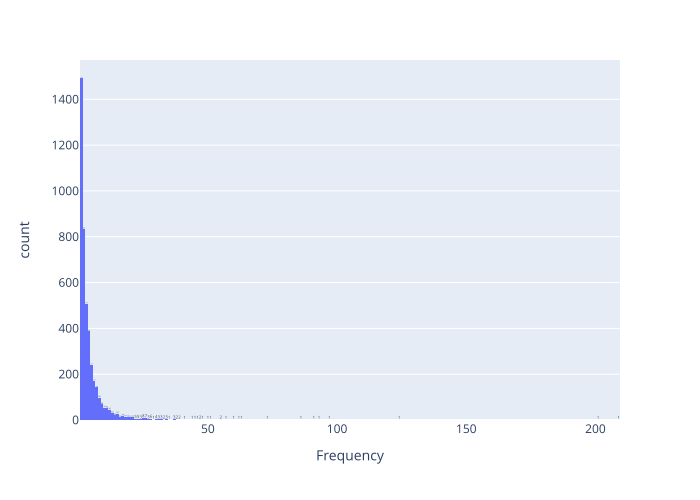

In [69]:
px.histogram(rfm, x="Frequency", text_auto=True)

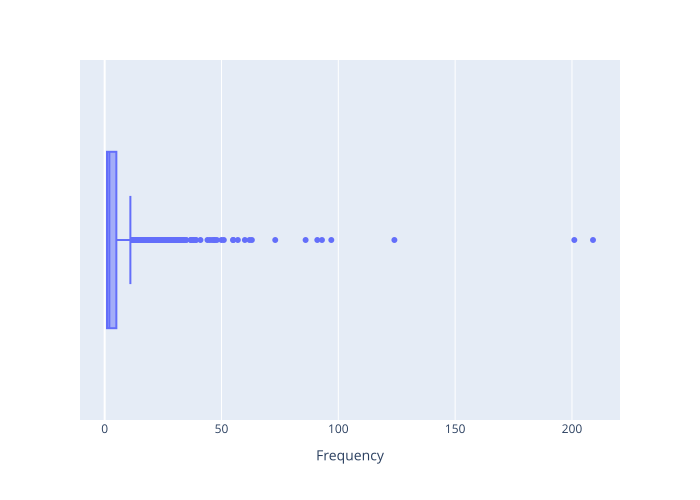

In [70]:
px.box(rfm, x="Frequency")

In [71]:
rfm[rfm["Frequency"] == 201]

,CustomerID,Frequency,Monetary,TotalQuantity,UniqueProducts,Recency,CustomerLifetime,AvgOrderValue
1879,14911.0,201,143711.17,80240,1787,1,372,714.980945


In [72]:
rfm[rfm["Frequency"] == 209]

,CustomerID,Frequency,Monetary,TotalQuantity,UniqueProducts,Recency,CustomerLifetime,AvgOrderValue
326,12748.0,209,33053.19,25287,1768,1,372,158.149234


In [80]:
from datasist.structdata import detect_outliers

idx = detect_outliers(rfm, 0 , ['Frequency'])
len(idx )


285

### **Monetary**

In [81]:
rfm.Monetary.describe()

count      4338.00000
mean       2048.68808
std        8985.23022
min           3.75000
25%         306.48250
50%         668.57000
75%        1660.59750
max      280206.02000
Name: Monetary, dtype: float64

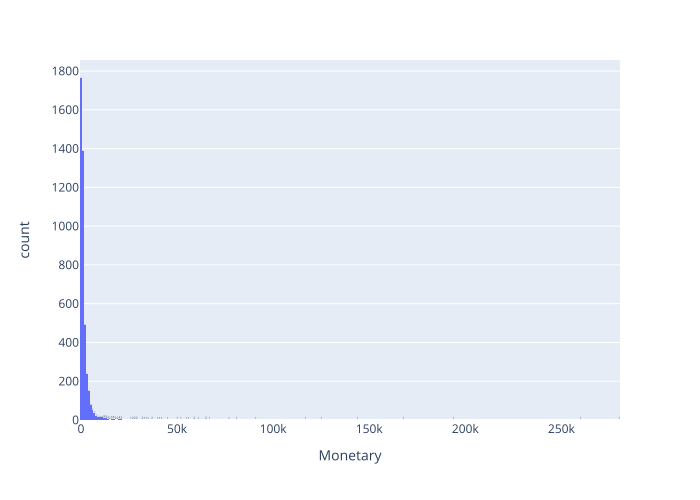

In [76]:
px.histogram(rfm, x="Monetary", text_auto=True)

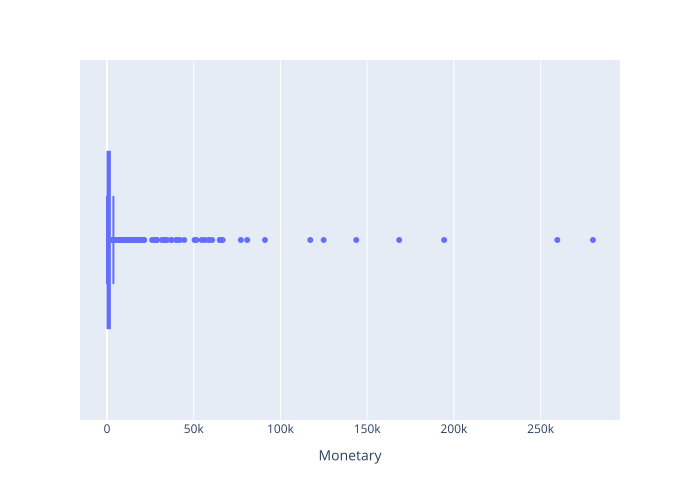

In [77]:
px.box(rfm, x="Monetary")

In [78]:
rfm[rfm["Monetary"] == 280206.020000]

,CustomerID,Frequency,Monetary,TotalQuantity,UniqueProducts,Recency,CustomerLifetime,AvgOrderValue
1689,14646.0,73,280206.02,196915,700,2,353,3838.43863


In [79]:
from datasist.structdata import detect_outliers

idx = detect_outliers(rfm, 0 , ['Monetary'])
len(idx )

425

### **Recency**

In [82]:
rfm.Recency.describe()

count    4338.000000
mean       92.536422
std       100.014169
min         1.000000
25%        18.000000
50%        51.000000
75%       142.000000
max       374.000000
Name: Recency, dtype: float64

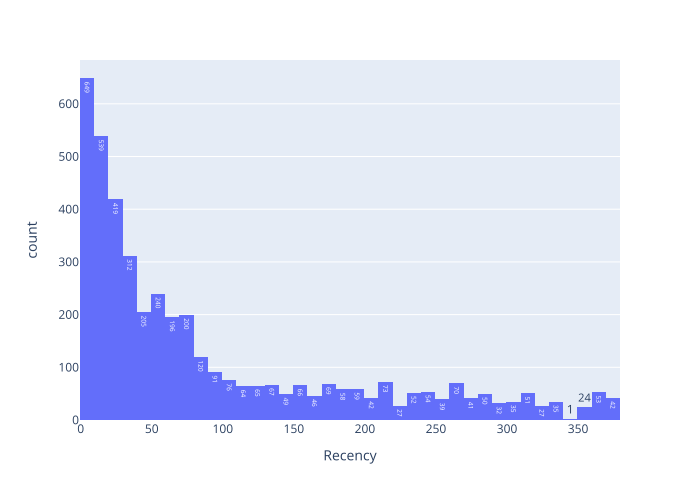

In [83]:
px.histogram(rfm, x="Recency", text_auto=True)

In [84]:
from datasist.structdata import detect_outliers

idx = detect_outliers(rfm, 0 , ['Recency'])
len(idx )

155

### **Handling Skewness and Outliers in RFM Features**

Observations:
- All three main RFM columns (**Recency**, **Frequency**, **Monetary**) show strong **right-skewness**.

Decisions:
1. **Outliers will not be removed**  
   → These high-value customers represent important and real behavioral patterns (e.g., VIP/whale customers) that should be preserved for meaningful segmentation.

2. **Skewness and outlier impact will be handled using the Yeo-Johnson transformation**  
   → This will be applied inside the ML pipeline during the preprocessing/modeling step

3. ***Validation approach***  
   - Create a copy of the RFM table  
   - Apply Yeo-Johnson transformation manually on this copy  
   - Compare distributions (before vs. after) using histograms/KDE/box plots  
   - Evaluate whether the transformation improves symmetry and reduces outlier influence before integrating it into the pipeline.

### **Validation approach**

In [85]:
from sklearn.preprocessing import PowerTransformer

# Columns to transform
cols = ['Monetary', 'Frequency']

# Copy original df to keep original values
rfm_transformed = rfm.copy()


In [86]:
# Initialize PowerTransformer
pt = PowerTransformer(method='yeo-johnson')

# Fit & transform
rfm_transformed[cols] = pt.fit_transform(rfm[cols])


In [87]:
rfm_transformed['Monetary_YJ'] = pt.fit_transform(rfm[['Monetary']])
rfm_transformed['Frequency_YJ'] = pt.fit_transform(rfm[['Frequency']])

In [88]:
# Compare skew before & after
print("Original skew:")
print(rfm[['Monetary', 'Frequency']].skew())

print("\nTransformed skew:")
print(rfm_transformed[['Monetary_YJ', 'Frequency_YJ']].skew())


Original skew:
Monetary     19.339368
Frequency    12.067031
dtype: float64

Transformed skew:
Monetary_YJ    -0.014303
Frequency_YJ    0.216627
dtype: float64


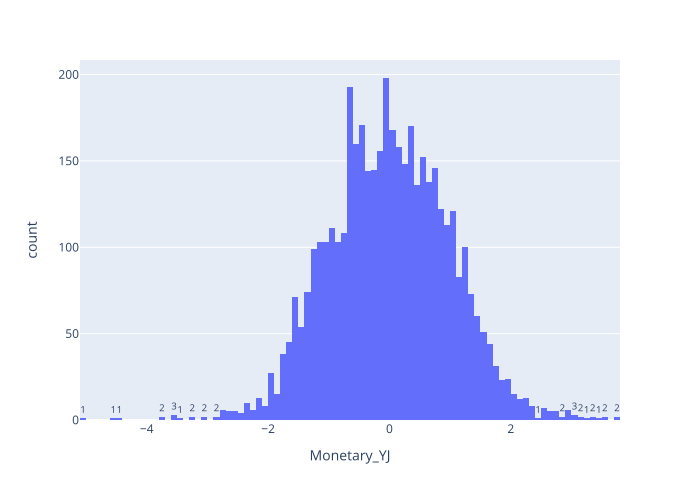

In [89]:
px.histogram(rfm_transformed, x="Monetary_YJ", text_auto=True)

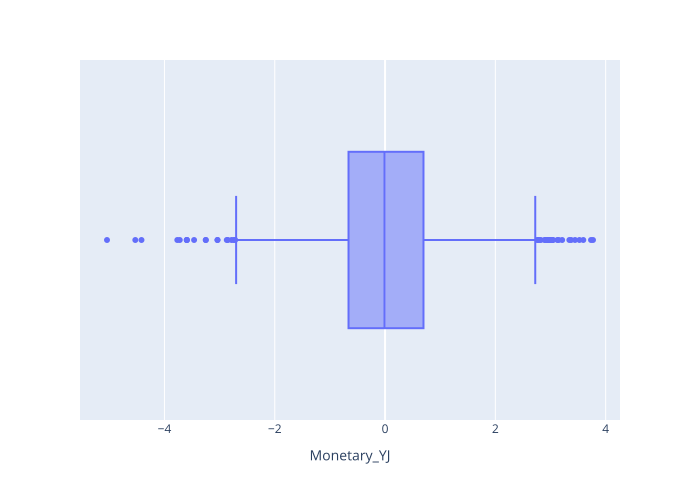

In [90]:
px.box(rfm_transformed, x="Monetary_YJ")

In [91]:
from datasist.structdata import detect_outliers

idx = detect_outliers(rfm_transformed, 0 , ['Monetary_YJ'])
len(idx )

42

####  Final Decision on Skewness Handling

- Yeo-Johnson transformation results look very good  
- → Will apply Yeo-Johnson to handle skewness in all RFM features  
- → Integrate into ML pipeline (preprocessing step)

### **CustomerLifetime**

In [92]:
rfm.CustomerLifetime.describe()

count    4338.000000
mean      130.448594
std       132.039554
min         0.000000
25%         0.000000
50%        92.500000
75%       251.750000
max       373.000000
Name: CustomerLifetime, dtype: float64

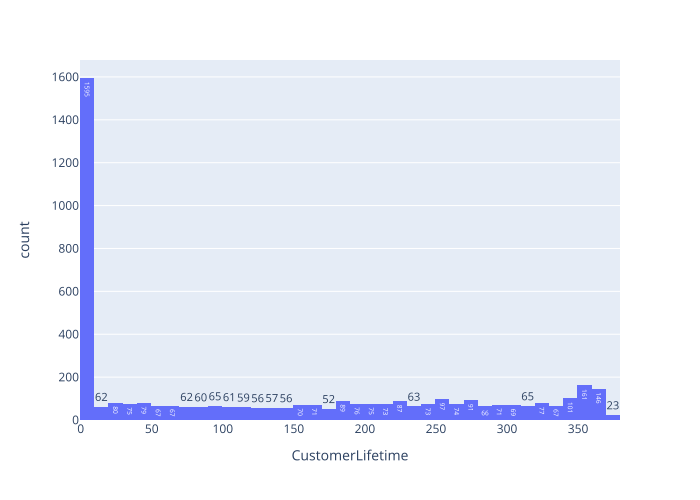

In [93]:
px.histogram(rfm, x="CustomerLifetime", text_auto=True)

In [94]:
from datasist.structdata import detect_outliers

idx = detect_outliers(rfm, 0 , ['CustomerLifetime'])
len(idx )

0

In [95]:
rfm.columns

Index(['CustomerID', 'Frequency', 'Monetary', 'TotalQuantity',
       'UniqueProducts', 'Recency', 'CustomerLifetime', 'AvgOrderValue'],
      dtype='object')

### **TotalQuantity**

In [96]:
rfm.TotalQuantity.describe()

count      4338.000000
mean       1187.644537
std        5043.619654
min           1.000000
25%         159.000000
50%         378.000000
75%         989.750000
max      196915.000000
Name: TotalQuantity, dtype: float64

In [97]:
rfm.TotalQuantity.unique()

array([74215,  2458,  2341, ...,  1475,  1468,  1586], shape=(1749,))

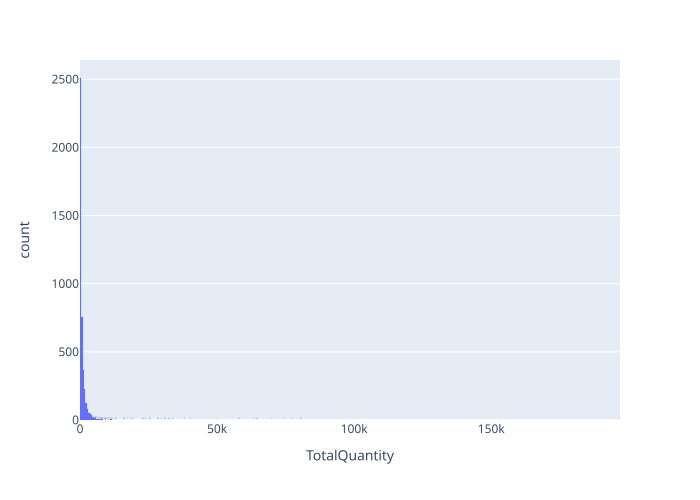

In [98]:
px.histogram(rfm, x="TotalQuantity", text_auto=True)

### **AvgOrderValue**

In [99]:
rfm.AvgOrderValue.describe()

count     4338.000000
mean       417.645735
std       1796.511343
min          3.450000
25%        177.867083
50%        291.940000
75%        428.280625
max      84236.250000
Name: AvgOrderValue, dtype: float64

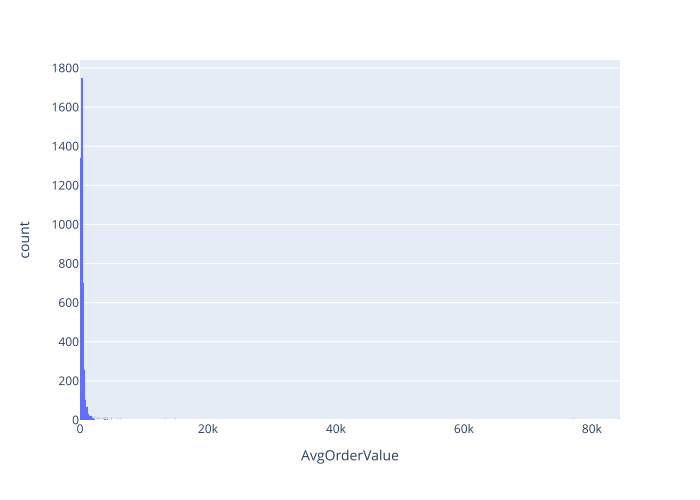

In [100]:
px.histogram(rfm, x="AvgOrderValue", text_auto=True)

# - **Analysis before clustring**


**We will do some important analysis first**

Using:
- RFM table
- Original transactional data (every single order)

**Main goals:**
- Understand customers better
- Find strong patterns
- Get useful business insights
- Help us choose best features → clustering


## **1- Analysis using RFM table**

In [101]:
rfm_analysis = rfm.copy()

In [102]:
# rename columns to make names understandable
rfm_analysis.rename(columns={
    "Frequency": "Number_of_Orders",
    "Monetary": "Total_Spend",

    "TotalQuantity": "Total_Items_Purchased",
    "UniqueProducts": "Product_Diversity",
    "Recency": "Days_Since_Last_Purchase",

    "CustomerLifetime": "Customer_Lifetime_Days",
    "AvgOrderValue": "Average_Order_Value"
}, inplace=True)


In [103]:
rfm_analysis.columns

Index(['CustomerID', 'Number_of_Orders', 'Total_Spend',
       'Total_Items_Purchased', 'Product_Diversity',
       'Days_Since_Last_Purchase', 'Customer_Lifetime_Days',
       'Average_Order_Value'],
      dtype='object')

In [104]:
rfm_analysis.drop_duplicates(inplace= True)
rfm_analysis.reset_index(inplace= True, drop= True)

In [105]:
rfm_analysis.to_csv("RFM_Analysis.csv", index=False)

### 1.  **Do customers who place more orders spend more money overall**

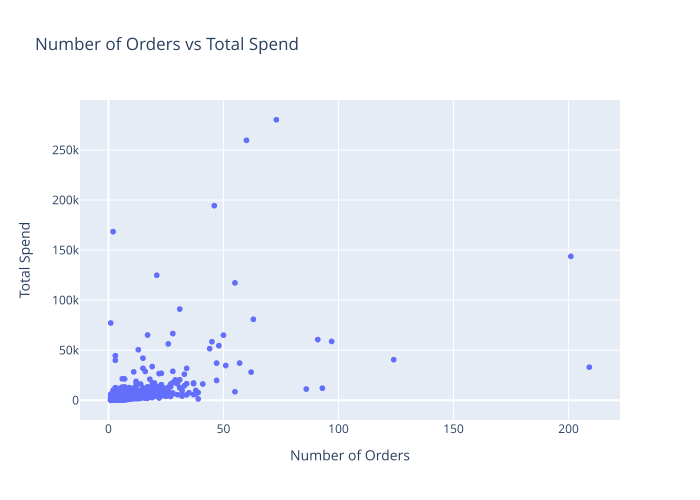

In [106]:
fig = px.scatter(
    rfm_analysis,
    x="Number_of_Orders",
    y="Total_Spend",
    title="Number of Orders vs Total Spend",
    labels={
        "Number_of_Orders": "Number of Orders",
        "Total_Spend": "Total Spend"
    }
)

fig.show()

##### **1. Customers who order more often spend dramatically more in total — the pattern is very strong and almost linear in the upper range.**

##### **2. The majority of customers order very few times (mostly 1–10 orders) → they contribute only a small portion of revenue (typically under 20–50k EGP lifetime).**

##### **3. A small group of high-frequency customers (30–200+ orders) generates the lion’s share of total spend — many in the 50k–250k+ range.**

### **2. Do customers who buy more product types spend more?**

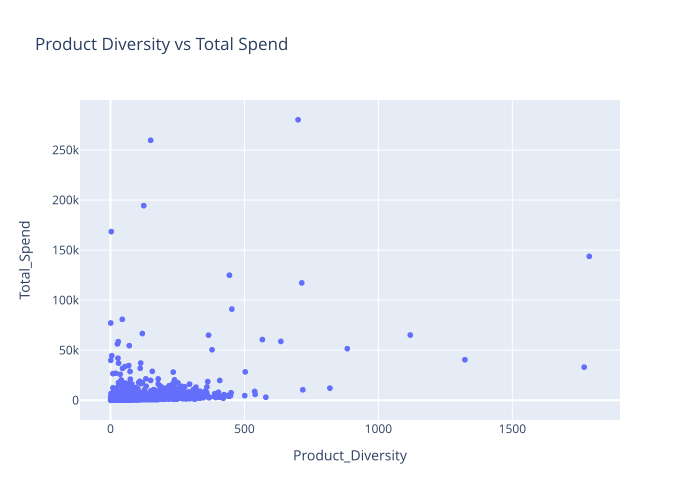

In [107]:
fig = px.scatter(
    rfm_analysis,
    x="Product_Diversity",
    y="Total_Spend",
    title="Product Diversity vs Total Spend"
)

fig.show()


##### **1. Customers who buy a wider variety of product types (higher Product Diversity) tend to spend significantly more in total — the link is clear and positive.**


##### **2. As diversity increases beyond ~200–400 types, total spend starts to rise noticeably.**

##### **3. Very few high-spend customers exist among those who only buy a narrow range of items.**


#### **-summary**

##### **Customers who explore and buy from many different product categories are dramatically more valuable — variety is a powerful predictor of high lifetime spend.**

### **3. Do long-term customers always generate more revenue?**

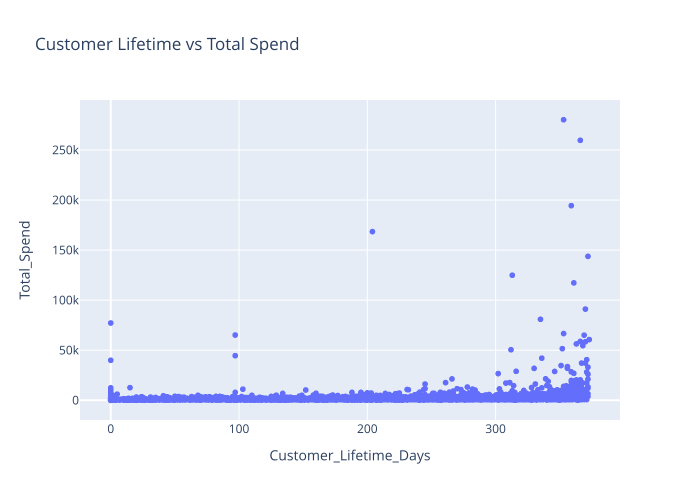

In [108]:
fig = px.scatter(
    rfm_analysis,
    x="Customer_Lifetime_Days",
    y="Total_Spend",
    trendline="ols",
    title="Customer Lifetime vs Total Spend"
)

fig.show()

##### **1. Customers with short lifetime (0–100 days) mostly have low total spend (almost all under 10–20k).**

##### **2. The highest spenders (100k–250k+) are almost all in the longer-lifetime group (250–350+ days).**

**- However**:

***many long-term customers still spend very little — the chart shows a huge cluster of low-spend people even at 300–350 days.***

#### **-summary**

##### **Longer customer relationships open the door to much higher revenue, but not every long-term customer walks through it**


### **4. Do customers who buy in bulk spend more or just buy cheap items?**

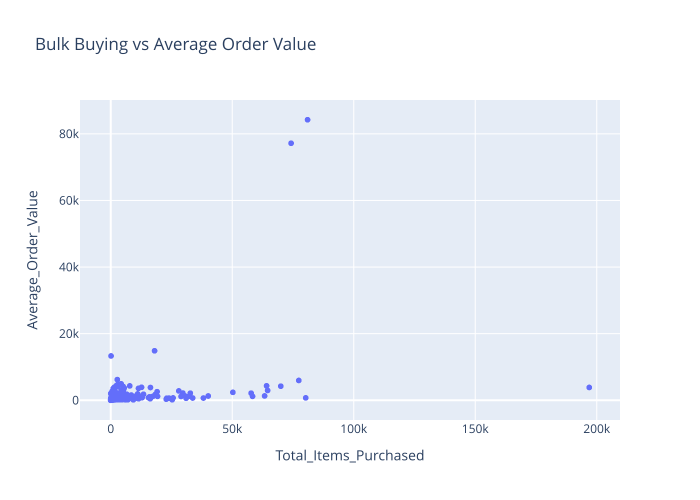

In [109]:
fig = px.scatter(
    rfm_analysis,
    x="Total_Items_Purchased",
    y="Average_Order_Value",
    title="Bulk Buying vs Average Order Value"
)

fig.show()


**1. Customers who buy in bulk (high Total Items Purchased) do not necessarily spend more per order — in fact, the opposite is more common.**

**2. The vast majority of bulk buyers (high total items) have very low average order value (most under 5–10k per order).**

**3 .They tend to buy large quantities of cheaper items rather than expensive ones.**

High average order value (20k–90k per order) almost only appears among customers with low-to-moderate total items (mostly under 20–50k total items purchased).


#### **- Summary**

**1. bulk buyers are typically volume-driven (lots of low-price items), not value-driven (fewer expensive items).**

**2. Bulk buyers usually buy lots of cheap items rather than expensive ones — high average order value comes from customers who buy fewer, higher-priced products.”**

## **2- Analysis using original data (for Insights can't covered using RFM Table )**

### **5. Which products drive most revenue?**

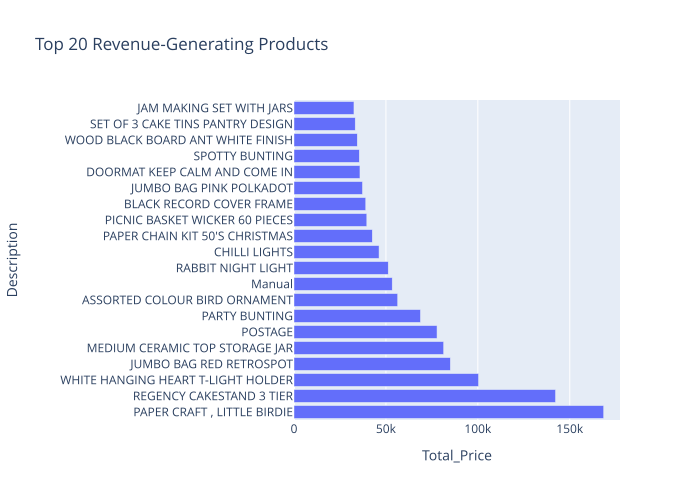

In [110]:
top_products = (

    df.groupby(["StockCode", "Description"])["Total_Price"]

      .sum()
      .reset_index()
      .sort_values("Total_Price", ascending=False)
      .head(20)

)

fig = px.bar(
    top_products,
    x="Total_Price",
    y="Description",
    orientation="h",
    title="Top 20 Revenue-Generating Products"
)

fig.show()



**The absolute #1 product by far is REGENCY CAKESTAND 3 TIER → generates over 120k in total revenue (clearly the standout winner).**

**The next strongest performers are in the 60–100k range:**

- WHITE HANGING HEART T-LIGHT HOLDER

- JUMBO BAG RED RETROSPOT

- MEDIUM CERAMIC TOP STORAGE JAR

- POSTAGE (likely shipping fees, but still counts as revenue driver)
PARTY BUNTING


###### **- Summray**

**Our revenue is driven by a tiny group of hero products — the Regency Cakestand 3 Tier alone generates far more than most others, so let’s double down on stocking, promoting, and never running out of these top performers**

In [111]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'invoice_weekday',
       'invoice_month', 'invoice_year', 'invoice_hour', 'Total_Price'],
      dtype='object')

### **6. Which countries generate high revenue but low order volum?**

In [112]:
country_summary = (
    df.groupby("Country")
      .agg(
          Total_Revenue=("Total_Price", "sum")
      )
      .reset_index()
      .sort_values(by="Total_Revenue", ascending=False)
)


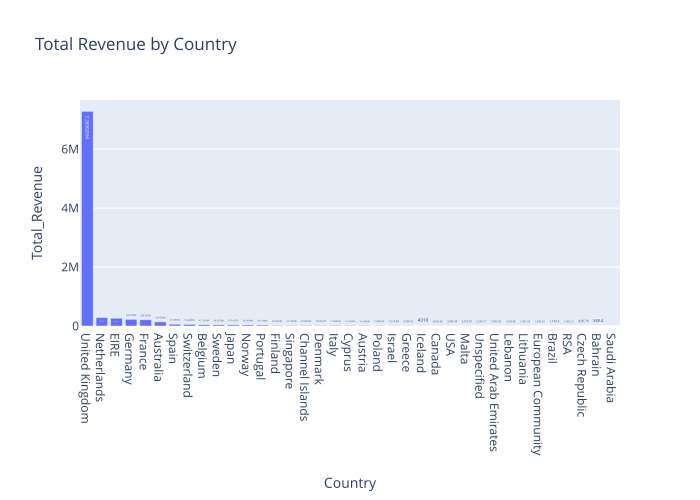

,Country,Total_Revenue
35,United Kingdom,7285024.644
23,Netherlands,285446.340
10,EIRE,265262.460
14,Germany,228678.400
13,France,208934.310
0,Australia,138453.810
30,Spain,61558.560
32,Switzerland,56443.950
3,Belgium,41196.340
31,Sweden,38367.830


In [113]:
fig = px.bar(
    country_summary,
    x="Country",
    y="Total_Revenue",
    text_auto=True,
    title="Total Revenue by Country"
)

fig.show()
country_summary.head(10)


**1. Revenue is extremely concentrated in just a few countries — the top 3–5 dominate almost everything.**

**2. United Kingdom is the clear #1 by far → generates over 6 million in total revenue (about 60–70%+ of everything shown).**

**3. Many countries (especially outside Europe) have very low or almost zero contribution → e.g., Saudi Arabia, Bahrain, Brazil, Lebanon, USA, Canada are tiny in comparison.**


#### **- summary:**

**Our revenue is overwhelmingly driven by the United Kingdom and a handful of European markets — the UK alone accounts for most of our total, so protecting and growing that core market is priority**




### **7.Which months are the strongest for sales?**

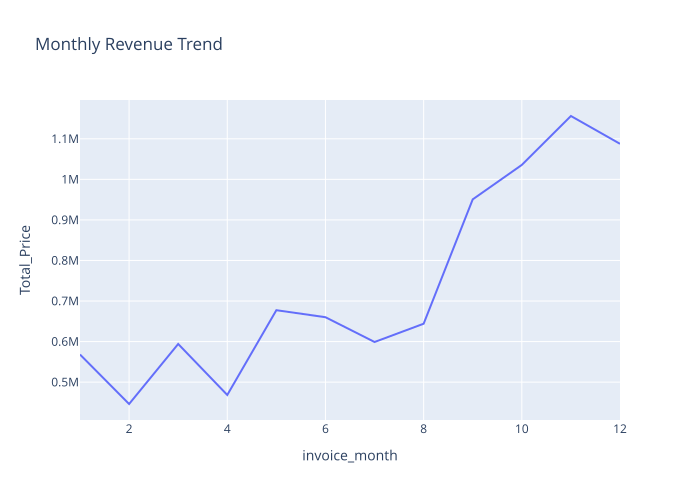

In [114]:
month_revenue = (
    df.groupby( ["invoice_month"] )["Total_Price"]
      .sum()
      .reset_index()
)

fig = px.line(
    month_revenue,
    x="invoice_month",
    y="Total_Price",
    title="Monthly Revenue Trend"
)

fig.show()


- **Sales show clear seasonal peaks and dips across the year, with two standout strong months.**

**The absolute strongest month is month 10 (October) → highest revenue at around 1M+ (peak of the year).**

**Month 9 (September) is also very strong → close second with ~0.95M.
Another solid peak in month 5–6 (May–June) → around 0.68–0.7M, showing a mid-year lift.**

**The weakest months are month 4 (April) and especially month 11 (November) → sharp drops to ~0.45–0.5M.**


#### **- summary:**

Our strongest sales months are October and September — we see a big Q4 surge, so let's front-load marketing and stock up early to capture the holiday momentum and avoid the November dip.”

### **8. Which days of the week generate the highest revenue?**

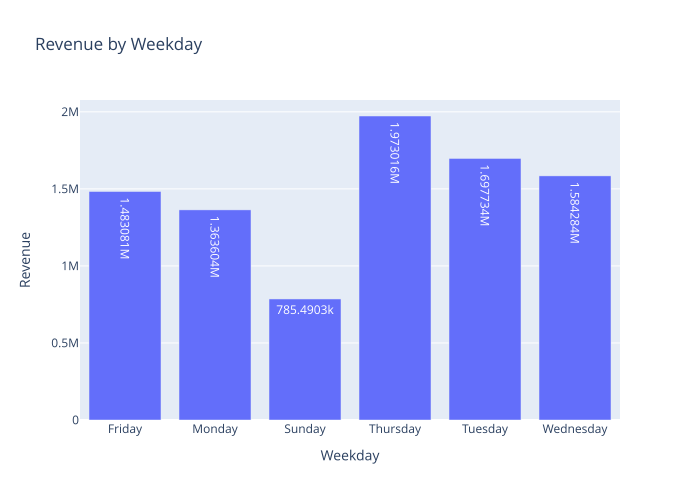

In [131]:
weekday_revenue = (
    df.groupby("invoice_weekday")["Total_Price"]
      .sum()
      .reset_index()
)

fig = px.bar(
    weekday_revenue,
    x="invoice_weekday",
    y="Total_Price",
    title="Revenue by Weekday",
    text_auto=True,
    labels={"invoice_weekday": "Weekday", "Total_Price": "Revenue"}

)

fig.show()

**Thursday is our strongest revenue day by a clear margin, followed by Tuesday and Wednesday — mid-week is when customers spend the most, while Sundays are consistently the slowest.”**

### **9. What hours generate most revenue?**

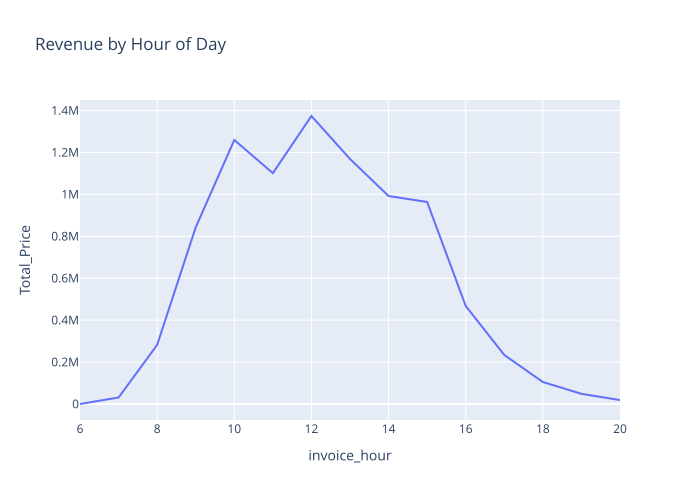

In [132]:
hourly_revenue = (
    df.groupby("invoice_hour")["Total_Price"]
      .sum()
      .reset_index()
)

import plotly.express as px

fig = px.line(
    hourly_revenue,
    x="invoice_hour",
    y="Total_Price",
    title="Revenue by Hour of Day"
)

fig.show()


#### **Revenue shows a clear daily rhythm with a strong peak in the late morning to early afternoon.**

**1. The highest revenue comes between 10:00 and 12:00 (hours 10–12) → this is the absolute peak, reaching around 1.2M at hour 12.**

**2. Strong build-up starts from 8:00–10:00 → revenue rises quickly and sharply.**

**3. After the midday peak (around noon), revenue steadily declines through the afternoon and evening → drops significantly after 14:00–16:00 and becomes very low from 18:00 onward.**

# **Final Summary & Business Recommendations**

### Executive Summary
Our customer base follows classic **80/20** behavior very strongly:

- A small group of **frequent, long-term, variety-seeking customers** generates the majority of revenue.
- **United Kingdom** dominates total revenue (≈60–70%), followed by a few European countries.
- Strong **seasonal peaks** in September–October (holiday / Q4 shopping).
- **Mid-week** (especially Thursday) and **late morning to early afternoon** (10:00–12:00) bring the highest sales.
- Top revenue products are mostly **affordable home decor, kitchen items, party supplies, and decorative lights** — Regency Cakestand 3 Tier is the clear #1 hero product.

## Key Insights – Core Patterns

1. **Frequency Drives Revenue**  
   More orders = dramatically higher total spend.  
   Repeat buyers (30+ orders) are our real high-value customers.

2. **Product Variety = Higher Value**  
   Customers who buy many different product types spend significantly more.  
   Variety seekers are much more valuable than single-category buyers.

3. **Long Lifetime Helps — But Not Automatic**  
   Longer relationships increase the chance of high spend, but many long-term customers stay low-value.

4. **Bulk Buyers vs High-Ticket Buyers**  
   Bulk buyers usually buy lots of cheap items → low average order value.  
   High average order value comes from customers buying fewer, more expensive items.

5. **Geographic Concentration**  
   United Kingdom is responsible for most revenue.  
   After top 5 European countries, contribution drops very sharply.

6. **Seasonal & Time Patterns**  
   - Strongest months: **October > September** (Q4 holiday surge)  
   - Strongest weekday: **Thursday** (mid-week peak)  
   - Strongest hours: **10:00–12:00** (working hours / lunch time)

7. **Hero Products**  
   Revenue is driven by a very small number of top-selling items (Regency Cakestand 3 Tier, White Hanging Heart T-Light Holder, Jumbo Bags, Party Bunting, etc.).

## Strategic Recommendations

### 1. Protect & Grow Repeat & High-Value Customers
- Build strong **loyalty & repeat-purchase programs** for customers who already ordered 5–20+ times.
- Give special treatment to **high-frequency + high-variety** customers (personal offers, early access, VIP events).
- Create a **VIP / Whale** segment (top 1–5% spenders) with dedicated care (account managers, exclusive deals).

### 2. Focus Marketing & Inventory on Peak Times
- Increase ad budget, promotions, email & push notifications during **September–October**, **Thursday**, and **10:00–12:00**.
- Plan inventory and staffing around **Q4 surge** — avoid stockouts of hero products in peak months.
- Reduce spend on low-performance times (Sunday, evenings, November lull).

### 3. Double Down on Hero Products & Categories
- Always keep **top 10–15 products** in stock — especially Regency Cakestand, Jumbo Bags, Party Bunting, lights, and kitchen/party items.
- Create **product bundles** and **cross-sell recommendations** around these winners.
- Promote **variety** — encourage customers to try new categories (e.g., "customers also bought…" featuring top sellers).

### 4. Geographic Focus
- **Protect and grow the UK market** — this is our main engine.
- Invest carefully in next-strongest markets (Netherlands, Ireland, Germany, France).
- Treat non-European countries as experimental — low priority until they show real growth.

### 5. Product & Customer Strategy
- Push **high-ticket items** to increase average order value.
- Use **retargeting & reminders** to turn one-time / low-frequency buyers into repeat customers.
- Analyze why many long-term customers stay low-value — maybe offer incentives to explore more categories.

**One-liner takeaway for leadership**  
“Our biggest revenue comes from repeat UK customers who buy many different items during mid-week in Q4 — let’s protect the heroes, time our promotions perfectly, and turn more people into frequent, high-value buyers.”


# **prepare RFM to modeling**

### 1. drop uneccery column and keep important columna

In [133]:
rfm.columns

Index(['CustomerID', 'Frequency', 'Monetary', 'TotalQuantity',
       'UniqueProducts', 'Recency', 'CustomerLifetime', 'AvgOrderValue'],
      dtype='object')

In [134]:
# drop unnceccry columns and rename
rfm_model = (
    rfm
    .drop(columns=[
        "CustomerID",
        "TotalQuantity",
        "UniqueProducts",
        "CustomerLifetime",
        "AvgOrderValue"
    ])
    .rename(columns={
        "Frequency": "Number_of_Orders",
        "Monetary": "Total_Spend",
        "Recency": "Days_Since_Last_Purchase"
    })
)

rfm_model.head()


,Number_of_Orders,Total_Spend,Days_Since_Last_Purchase
0,1,77183.60,326
1,7,4310.00,2
2,4,1797.24,75
3,1,1757.55,19
4,1,334.40,310


In [135]:
rfm_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4338 entries, 0 to 4337
Data columns (total 3 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Number_of_Orders          4338 non-null   int64  
 1   Total_Spend               4338 non-null   float64
 2   Days_Since_Last_Purchase  4338 non-null   int64  
dtypes: float64(1), int64(2)
memory usage: 101.8 KB


### 2. outliers

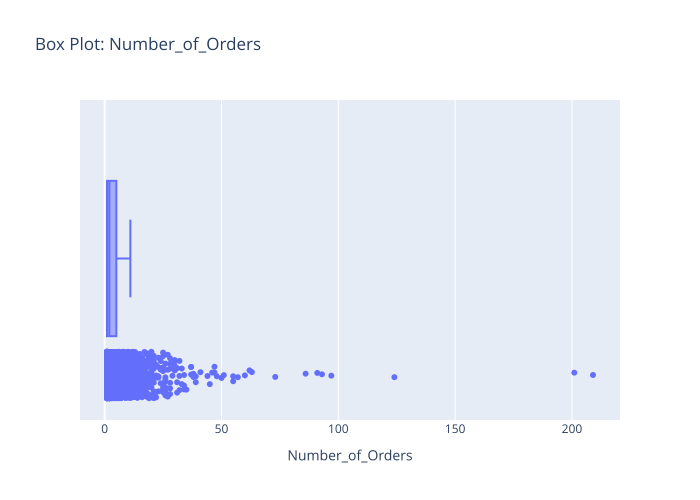

Column: Number_of_Orders → Total Outliers: 285



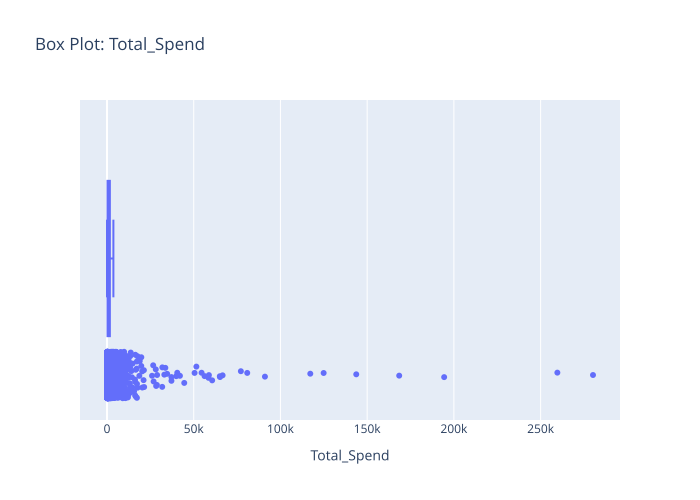

Column: Total_Spend → Total Outliers: 425



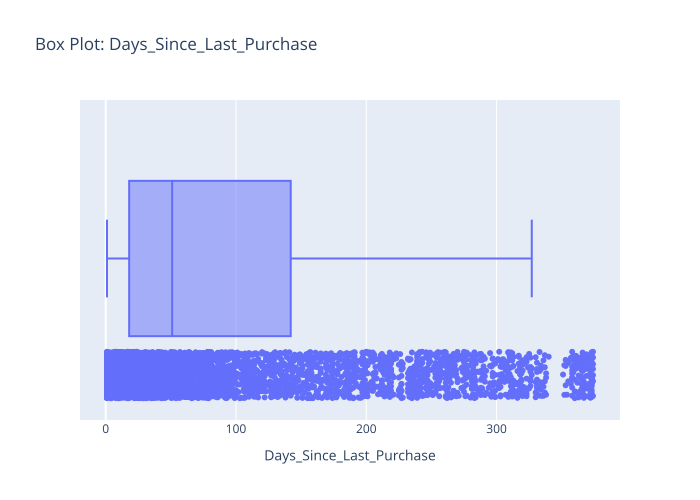

Column: Days_Since_Last_Purchase → Total Outliers: 155



In [136]:
from datasist.structdata import detect_outliers

# Columns
columns = ["Number_of_Orders", "Total_Spend", "Days_Since_Last_Purchase"]

for col in columns:


 # 1️⃣ Box plot
    fig = px.box(rfm_model, x=col, points="all", title=f"Box Plot: {col}")
    fig.show()


    outliers_idx = detect_outliers(rfm_model, 0 , [col])
    n_outliers = len(outliers_idx)

    print(f"Column: {col} → Total Outliers: {n_outliers}\n")


Outliers → **keep** (needed to identify VIP customers)  
- Skewness → handle with **Yeo-Johnson** (reduces outlier impact + improves symmetry)  
- Goal: detect premium segments + better clustering

In [137]:
rfm_model.drop_duplicates(inplace= True)
rfm_model.reset_index(inplace= True, drop= True)

In [138]:
rfm_model.to_csv("RFM_Model.csv", index=False)

# **modeling**

In [139]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import KMeans

from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

import scipy.cluster.hierarchy as sch
import plotly.figure_factory as ff
import plotly.graph_objects as go


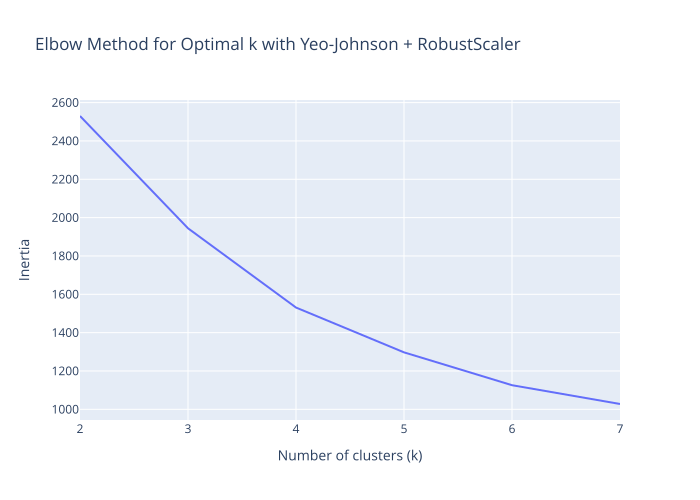

In [148]:
# Elbow Method to determine optimal k
inertia = []
k_values = range(2, 8 )
for k in k_values:
    steps =[]
    steps.append(('yeojohnson', PowerTransformer(method='yeo-johnson')))
    steps.append(('scaler',RobustScaler()))
    steps.append(('model',KMeans(n_clusters=k )))
    pipeline = Pipeline(steps=steps)
    pipeline.fit(rfm_model)
    inertia.append(pipeline['model'].inertia_)


# Plotting the elbow curve
fig = px.line(
    x=k_values,
    y=inertia,
    labels={'x': 'Number of clusters (k)', 'y': 'Inertia'},
    title='Elbow Method for Optimal k with Yeo-Johnson + RobustScaler'
)
fig.show()

In [149]:
# pip install kneed

In [150]:
# using elbow to determinied best number of K
from kneed import KneeLocator

k = KneeLocator(x = k_values , y=inertia,direction='decreasing',curve='convex')

elbow = k.elbow


In [151]:
elbow

np.int64(4)

### **pipeline to apply transformation and model**

In [152]:
steps = []
steps.append(('yeojohnson', PowerTransformer(method='yeo-johnson')))
steps.append(('scaler', RobustScaler()))
steps.append(('model', KMeans(n_clusters= 3, random_state=42)))

# Create pipeline
Final_pipeline = Pipeline(steps=steps)

# Fit pipeline
Final_pipeline.fit(rfm_model)


Pipeline(steps=[('yeojohnson', PowerTransformer()), ('scaler', RobustScaler()),
                ('model', KMeans(n_clusters=3, random_state=42))])

In [153]:
labels = Final_pipeline.named_steps['model'].labels_

unique_clusters = np.unique(labels)
unique_clusters


array([0, 1, 2], dtype=int32)

In [154]:
# assign cluster labels to original data
rfm_model['cluster'] = Final_pipeline.predict(rfm_model)

# **clusters analysis**
### to see our model and clusters are good and have meaning or not

###  **1. Cluster Size & Distribution**

In [155]:
rfm_model["cluster"].value_counts(normalize= True)

cluster
2    0.393499
0    0.338405
1    0.268096
Name: proportion, dtype: float64

In [156]:
rfm_model.describe()

,Number_of_Orders,Total_Spend,Days_Since_Last_Purchase,cluster
count,4338.000000,4338.00000,4338.000000,4338.000000
mean,4.272015,2048.68808,92.536422,1.055095
std,7.697998,8985.23022,100.014169,0.853836
min,1.000000,3.75000,1.000000,0.000000
25%,1.000000,306.48250,18.000000,0.000000
50%,2.000000,668.57000,51.000000,1.000000
75%,5.000000,1660.59750,142.000000,2.000000
max,209.000000,280206.02000,374.000000,2.000000


#### **Apply statistical analysis on each cluster to better understand the characteristics and patterns of customers in every group.**

In [157]:
cluster_profile = (
    rfm_model
    .groupby("cluster")
    .agg(
        total_orders=("Number_of_Orders", "sum"),
        median_orders=("Number_of_Orders", "median"),
        total_spend=("Total_Spend", "sum"),
        median_spend=("Total_Spend", "median"),
        avg_recency_days=("Days_Since_Last_Purchase", "mean")
    )
    .round(2)
)

# 2️⃣ Customer distribution (%)
customer_pct = (
    rfm_model["cluster"]
    .value_counts(normalize=True)
    .mul(100)
    .round(1)
)

# -----------------------------
# 3️⃣ Revenue contribution (%)
revenue_pct = (
    rfm_model
    .groupby("cluster")["Total_Spend"]
    .sum()
    .div(rfm_model["Total_Spend"].sum())
    .mul(100)
    .round(1)
)

# -----------------------------
# 4️⃣ Combine everything
cluster_profile["customer_%"] = customer_pct
cluster_profile["revenue_%"] = revenue_pct

# -----------------------------
# 5️⃣ Final view
cluster_profile = cluster_profile.sort_index()

cluster_profile


,total_orders,median_orders,total_spend,median_spend,avg_recency_days,customer_%,revenue_%
cluster,,,,,,,
0,1797,1.0,392123.92,225.72,181.37,33.8,4.4
1,12114,7.0,6960977.41,2780.15,20.39,26.8,78.3
2,4621,2.0,1534107.56,727.74,65.30,39.3,17.3


#### **1. After evaluating mor than number of k solutions (3, 4, 5), and considering simplicity, revenue focus, campaign manageability, and operational ease, I recommend moving forward with** **k=3 clusters**.

#### **2.  Merging the two lowest-value groups (previous clusters 0 and 1) in k= 4 creates the **cleanest, most actionable, and most business-focused segmentation** we can achieve with this data.**

#### - Why k=3 is the best final choice

- **Better campaign efficiency**  
  Fewer segments = fewer parallel campaigns, lower complexity in CRM rules, easier A/B testing, and lower risk of over-targeting low-value customers.

- **Strong separation across all key dimensions**  
  The three groups are clearly distinct in **recency**, **spending power**, and **order behavior**.

  **Summary of revenue & customer distribution**

- **VIP** → 31% of base → **78% of revenue** (classic high-value core)
- **Solid Mid-Value** → 44% of base → only 12% revenue (volume group with upside)
- **Low-Value** → 25% of base → only 10% revenue (long tail – cost control needed)

### **Final Customer Segmentation**
| Cluster | Segment Name                  | % Customers | % Revenue | Avg Recency (days) | Typical Orders | Median Spend | Business Meaning & Priority Level |
|---------|-------------------------------|-------------|-----------|---------------------|----------------|--------------|-----------------------------------|
| 1       | **VIP**                 | 27.0%       | **78.3%** | ~27                 | 6+             | ~2,356       | Recent high-value repeat buyers – **Highest priority** – protect & grow |
| 2       | **Solid Mid-Value**           | 28.6%       | 12.1%     | ~44                 | 2              | ~645         | Occasional / lapsed mid-value – **Medium priority** – reactivate & upsell |
| 0       | **Low-Value & Inactive**      | 44.4%       | 9.5%      | ~165                | 1–2            | ~276         | Low spend, mostly inactive – **Lowest priority** – low-cost or suppress |


### **Strategic Recommendations by Segment**

1. **Champions – Core Revenue Drivers** (31% customers, 78% revenue)  
   - **Highest priority** – protect at all costs  
   - VIP treatment: personalized offers, early access, loyalty rewards, dedicated support  
   - Never allow stockouts on hero products they buy most  
   - Monitor churn signals weekly (increase in recency)

2. **Solid Mid-Value Customers** (44% customers, 12% revenue)  
   - **Main growth opportunity** – move them toward Champions behavior  
   - Targeted cross-sell / up-sell campaigns (variety bundles, "customers also bought…")  
   - Moderate-frequency incentives (points for next purchase, free shipping thresholds)  
   - Reactivation offers for those with higher recency

3. **Low-Value & Mostly Inactive** (25% customers, 10% revenue)  
   - **Lowest priority** – minimize marketing cost  
   - Low-cost automated win-back only (e.g. one "We miss you" email every 3–6 months)  
   - Consider suppressing from high-cost channels (paid ads, SMS) to save budget  
   - Focus on acquisition of new similar profiles rather than heavy reactivation

#### **Cluster Names**

In [158]:
Cluster_Names = {
    1: "VIP",
    2: "Mid_Value",
    0: "Low_Value & Inactive",


}

# Add the cluster name column to data frame
rfm_model['cluster_name'] = rfm_model['cluster'].map(Cluster_Names)

In [159]:
rfm_model

,Number_of_Orders,Total_Spend,Days_Since_Last_Purchase,cluster,cluster_name
0,1,77183.60,326,1,VIP
1,7,4310.00,2,1,VIP
2,4,1797.24,75,2,Mid_Value
3,1,1757.55,19,2,Mid_Value
4,1,334.40,310,0,Low_Value & Inactive
...,...,...,...,...,...
4333,1,180.60,278,0,Low_Value & Inactive
4334,1,80.82,181,0,Low_Value & Inactive
4335,2,178.05,8,2,Mid_Value
4336,16,2045.53,4,1,VIP


# Merge CustomerID back into clustered dataframe to save and use it

**Why?**
- CustomerID is needed to:
  - Identify real customers
  - Link clusters back to actual business data
  - Show personalized results in the dashboard / app
  - Allow the business team to take action (e.g., target specific customers in marketing campaigns)

In [160]:
# Merge CustomerID back into clustered dataframe
rfm_model['CustomerID'] = rfm_analysis['CustomerID'].values


In [161]:
rfm_model

,Number_of_Orders,Total_Spend,Days_Since_Last_Purchase,cluster,cluster_name,CustomerID
0,1,77183.60,326,1,VIP,12346.0
1,7,4310.00,2,1,VIP,12347.0
2,4,1797.24,75,2,Mid_Value,12348.0
3,1,1757.55,19,2,Mid_Value,12349.0
4,1,334.40,310,0,Low_Value & Inactive,12350.0
...,...,...,...,...,...,...
4333,1,180.60,278,0,Low_Value & Inactive,18280.0
4334,1,80.82,181,0,Low_Value & Inactive,18281.0
4335,2,178.05,8,2,Mid_Value,18282.0
4336,16,2045.53,4,1,VIP,18283.0


In [162]:
# rename and rearrange table name
rfm_model = rfm_model.rename(columns={
    'cluster': 'group',
    'cluster_name': 'group_name'
})

# Reorder columns to put CustomerID first
rfm_model = rfm_model[['CustomerID', 'Number_of_Orders', 'Total_Spend', 'Days_Since_Last_Purchase', 'group', 'group_name']]


In [163]:
rfm_model

,CustomerID,Number_of_Orders,Total_Spend,Days_Since_Last_Purchase,group,group_name
0,12346.0,1,77183.60,326,1,VIP
1,12347.0,7,4310.00,2,1,VIP
2,12348.0,4,1797.24,75,2,Mid_Value
3,12349.0,1,1757.55,19,2,Mid_Value
4,12350.0,1,334.40,310,0,Low_Value & Inactive
...,...,...,...,...,...,...
4333,18280.0,1,180.60,278,0,Low_Value & Inactive
4334,18281.0,1,80.82,181,0,Low_Value & Inactive
4335,18282.0,2,178.05,8,2,Mid_Value
4336,18283.0,16,2045.53,4,1,VIP


In [164]:
# 1️⃣ Group-level aggregation
Groups_profile = (
    rfm_model
    .groupby("group_name")
    .agg(
        number_of_Customers=("CustomerID", "count"),
        total_orders=("Number_of_Orders", "sum"),
        median_orders=("Number_of_Orders", "median"),
        total_spend=("Total_Spend", "sum"),
        median_spend=("Total_Spend", "median"),
        avg_recency_days=("Days_Since_Last_Purchase", "mean")
    )
    .round(2)
)

# 2️⃣ Customer distribution (%)
customer_pct = (
    rfm_model["group_name"]
    .value_counts(normalize=True)
    .mul(100)
    .round(1)
)

# 3️⃣ Revenue contribution (%)
revenue_pct = (
    rfm_model
    .groupby("group_name")["Total_Spend"]
    .sum()
    .div(rfm_model["Total_Spend"].sum())
    .mul(100)
    .round(1)
)

# 4️⃣ Combine all into one profile table
Groups_profile["customer_%"] = customer_pct
Groups_profile["revenue_%"] = revenue_pct

# 5️⃣ Optional: sort by group or any metric
Groups_profile = Groups_profile.sort_index()

Groups_profile


,number_of_Customers,total_orders,median_orders,total_spend,median_spend,avg_recency_days,customer_%,revenue_%
group_name,,,,,,,,
Low_Value & Inactive,1468,1797,1.0,392123.92,225.72,181.37,33.8,4.4
Mid_Value,1707,4621,2.0,1534107.56,727.74,65.30,39.3,17.3
VIP,1163,12114,7.0,6960977.41,2780.15,20.39,26.8,78.3


In [ ]:
# Save to CSV to use in streamlot
Groups_profile.to_csv("Groups_profile.csv", index=False)

In [ ]:
# Save to CSV to use in streamlit 
rfm_model.to_csv('rfm_segments.csv', index=False)